In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sys
import os
from glob import glob
from operator import itemgetter

import matplotlib.pyplot as plt
import seaborn as sns

sys.path.insert(0,'/home/ROBARTS/myousif/software/hippunfold_toolbox/')
from hippunfold_toolbox import plotting

In [2]:
import nibabel as nib

In [3]:
sys.path.insert(0,'/home/ROBARTS/myousif/software/hippomaps//')
from hippomaps.utils import surfdat_smooth

In [4]:
sys.path.insert(0,'/home/ROBARTS/myousif/software/PCNtoolkit/')
from pcntoolkit.normative import estimate, evaluate, predict
# from pcntoolkit.normative_model import norm_blr
# import pcntoolkit as pcn
# import importlib
# importlib.reload(pcn)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
from brainstat.stats.terms import FixedEffect
from brainstat.stats.SLM import SLM
from brainspace.mesh.mesh_io import read_surface

In [172]:
def reshape_1D(array):
    arr_split = np.split(array,2)
    return np.stack(arr_split).T

def reshape4surfplot(input_arr):
    multi_arr = []
    for arr in input_arr:
        multi_arr.append(reshape_1D(arr))
    return np.stack(multi_arr,axis=2)


In [7]:
hippunfold_surf = nib.load('/home/ROBARTS/myousif/software/hippunfold_toolbox/resources/canonical_surfs/tpl-avg_space-canonical_den-2mm_label-hipp_midthickness.surf.gii')

In [10]:
hippunfold_surf.get_arrays_from_intent('NIFTI_INTENT_TRIANGLE')[0].data

(774, 3)

In [173]:
snsx_df = pd.read_csv('/home/ROBARTS/myousif/projects_inprogress/snsx_clinical_data/snsx_clinical_data_extraction/snsx_data_collection.csv')

In [174]:
snsx_qc = pd.read_csv('/home/ROBARTS/myousif/graham/projects/ctb-akhanf/myousif9/norm_models/datasets/snsx/derivatives_7T/hippunfold_qc.csv')

In [175]:
snsx_qc = snsx_qc[['participant_id','pass']]

In [176]:
snsx_vars_df = snsx_df[['participant_id','age','sex','Temporal','Bilobal', 'Right ', 'Left','Engel_IA', 'Engel_IB', 'Engel_IC',
       'Engel_ID', 'Engel_IIA', 'Engel_IIB', 'Engel_IIC', 'Engel_IID',
       'Engel_IIIA', 'Engel_IIIB', 'Engel_IVA', 'Engel_IVB', 'Engel_IVC',
       'Engel_I=1', 'ilae_1', 'ilae_2', 'ilae_3', 'ilae_4', 'ilae_5', 'ilae_6', 'MRI (0=no/1=yes) Normal', 'MRI (0=no/1=yes) MTS']]

In [177]:
snsx_vars_df.columns = ['participant_id','age','sex','Temporal','Bilobal', 'Right ', 'Left','Engel_IA', 'Engel_IB', 'Engel_IC',
       'Engel_ID', 'Engel_IIA', 'Engel_IIB', 'Engel_IIC', 'Engel_IID',
       'Engel_IIIA', 'Engel_IIIB', 'Engel_IVA', 'Engel_IVB', 'Engel_IVC',
       'Engel_I=1', 'ilae_1', 'ilae_2', 'ilae_3', 'ilae_4', 'ilae_5', 'ilae_6','MRI_Normal', 'MRI_MTS']

In [178]:

snsx_vars_df = snsx_vars_df.iloc[snsx_vars_df.participant_id.drop_duplicates().index]



In [179]:
snsx_epi_localization_df = snsx_df[['participant_id','Focal', 'Generalized', 'Unknown', 'Temporal', 'Frontal', 'Parietal','Insular', 'Occipital ', 'Bilobal', 'Right ', 'Left', 'Other']]

In [180]:
metric_names = ['thickness', 'curvature', 'gyrification', 'myelin']

In [24]:
ctrl_resp_paths = [f'snsx_data/{metric}_2mm_ctrl_resp.txt' for metric in metric_names]
ctrl_covs_paths = [f'snsx_data/{metric}_ctrl_bspline_cov.txt' for metric in metric_names]
                  
epi_resp_paths = [f'snsx_data/{metric}_2mm_epi_resp.txt' for metric in metric_names]
epi_covs_paths = [f'snsx_data/{metric}_epi_bspline_cov.txt' for metric in metric_names]

In [25]:
ctrl_covs_paths2 =  [p.replace('.txt','2.txt') for p in ctrl_covs_paths]
epi_covs_paths2 =  [p.replace('.txt','2.txt') for p in epi_covs_paths]

In [181]:
snsx_epi_df = pd.read_csv('snsx_data/thickness_epi_cov.csv',index_col=0)

In [182]:
snsx_epi_df = snsx_epi_df.iloc[snsx_epi_df.participant_id.drop_duplicates().index]

In [274]:
snsx_epi_cov_df = pd.merge(snsx_epi_df.participant_id.to_frame(),snsx_vars_df,on=['participant_id'],how='inner')

In [270]:

snsx_thick_epi_cov_df_qc = pd.merge(snsx_epi_cov_df,snsx_qc,on='participant_id',how='left')
snsx_thick_epi_cov_df_qc = snsx_thick_epi_cov_df_qc[snsx_thick_epi_cov_df_qc['pass'] == True]


In [185]:
snsx_gyr_df = pd.read_csv('snsx_data/gyrification_epi_cov.csv',index_col=0)
snsx_gyr_epi_df = snsx_gyr_df.iloc[snsx_gyr_df.participant_id.drop_duplicates().index]
snsx_gyr_epi_cov_df = pd.merge(snsx_gyr_epi_df.participant_id.to_frame(),snsx_vars_df,on=['participant_id'],how='inner')

In [269]:

snsx_gyr_epi_cov_df_qc = pd.merge(snsx_gyr_epi_cov_df,snsx_qc, on='participant_id', how='left')
snsx_gyr_epi_cov_df_qc = snsx_gyr_epi_cov_df_qc[snsx_gyr_epi_cov_df_qc['pass'] == True]



In [187]:
myelin_df = pd.read_csv('snsx_data/myelin_epi_cov.csv',index_col=0)

In [195]:


myelin_df_qc = pd.merge(myelin_df,snsx_qc,on='participant_id',how='left')
myelin_df_qc['pass'] = myelin_df_qc['pass'].fillna(True)
myelin_df_qc = myelin_df_qc[myelin_df_qc['pass']]
myelin_df_qc = pd.merge(myelin_df_qc.participant_id.to_frame(),snsx_vars_df,on='participant_id',how='left')




In [196]:
myelin_df_qc

,participant_id,age,sex,Temporal,Bilobal,Right,Left,Engel_IA,Engel_IB,Engel_IC,...,Engel_IVC,Engel_I=1,ilae_1,ilae_2,ilae_3,ilae_4,ilae_5,ilae_6,MRI_Normal,MRI_MTS
0,sub-P008,26,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,sub-P012,28,m,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,sub-P013,37,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,sub-P014,33,m,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,sub-P018,29,f,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5,sub-P020,37,f,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
6,sub-P020,37,f,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7,sub-P021,32,f,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
8,sub-P022,21,f,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,sub-P026,36,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [202]:
myelin_cov_df

,participant_id,age,sex,Temporal,Bilobal,Right,Left,Engel_IA,Engel_IB,Engel_IC,...,Engel_IVC,Engel_I=1,ilae_1,ilae_2,ilae_3,ilae_4,ilae_5,ilae_6,MRI_Normal,MRI_MTS
0,sub-P008,26,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,sub-P012,28,m,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,sub-P013,37,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,sub-P014,33,m,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,sub-P018,29,f,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5,sub-P020,37,f,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7,sub-P021,32,f,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
8,sub-P022,21,f,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,sub-P026,36,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
10,sub-P028,20,f,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [163]:

myelin_cov_df = myelin_cov_df.iloc[myelin_cov_df.participant_id.drop_duplicates().index]
myelin_cov_df2 = myelin_cov_df.reset_index(drop=True)


In [191]:
metrics = ['thick','curv','gyr','myelin']

for i, met in enumerate(['thick','curv','gyr','myelin']):
    np.savetxt(f'snsx_data/snsx_{met}_ctrl_sites.txt',np.ones(len(np.loadtxt(ctrl_covs_paths[i])))*25)
    np.savetxt(f'snsx_data/snsx_{met}_epi_sites.txt',np.ones(len(np.loadtxt(epi_covs_paths[i])))*25)


    np.savetxt('snsx_epi_test.txt', np.loadtxt(epi_resp_paths[0]).T)
    np.savetxt('snsx_cov_test.txt', np.loadtxt(ctrl_resp_paths[0]).T)

out_test = transfer(epi_covs_paths2[0],
                    alg='blr',
                    respfile='snsx_epi_test.txt',
                    model_path = 'thick_2mm_bspline_blr_model/Models/',
                    saveout=False,
                    warp=True,
                    adaptrespfile = 'snsx_cov_test.txt',
                    adaptcovfile = ctrl_covs_paths2[0],
                    adaptvargroupfile = 'snsx_data/snsx_ctrl_sites.txt',
                    testvargroupfile= 'snsx_data/snsx_epi_sites.txt')

np.ones([3,5])[[True,False,False,False,False]]

In [34]:
yhat_thick, s2_thick, Z_thick = predict(epi_covs_paths2[0],
                            alg='blr',
                            respfile=epi_resp_paths[0],
                            model_path = 'thick_2mm_bspline_blr_model/Models/',
                            saveout=False,
                            adaptrespfile = ctrl_resp_paths[0],
                            adaptcovfile = ctrl_covs_paths2[0],
                            adaptvargroupfile = 'snsx_data/snsx_ctrl_sites.txt',
                            testvargroupfile= 'snsx_data/snsx_epi_sites.txt')

Loading data ...
Prediction by model  1 of 838
Prediction by model  2 of 838
Prediction by model  3 of 838
Prediction by model  4 of 838
Prediction by model  5 of 838
Prediction by model  6 of 838
Prediction by model  7 of 838
Prediction by model  8 of 838
Prediction by model  9 of 838
Prediction by model  10 of 838
Prediction by model  11 of 838
Prediction by model  12 of 838
Prediction by model  13 of 838
Prediction by model  14 of 838
Prediction by model  15 of 838
Prediction by model  16 of 838
Prediction by model  17 of 838
Prediction by model  18 of 838
Prediction by model  19 of 838
Prediction by model  20 of 838
Prediction by model  21 of 838
Prediction by model  22 of 838
Prediction by model  23 of 838
Prediction by model  24 of 838
Prediction by model  25 of 838
Prediction by model  26 of 838
Prediction by model  27 of 838
Prediction by model  28 of 838
Prediction by model  29 of 838
Prediction by model  30 of 838
Prediction by model  31 of 838
Prediction by model  32 of 838


In [35]:
yhat_gyr, s2_gyr, Z_gyr = predict(epi_covs_paths2[2],
                            alg='blr',
                            respfile=epi_resp_paths[2],
                            model_path = 'gyr_2mm_bspline_blr_model/Models/',
                            saveout=False,
                            adaptrespfile = ctrl_resp_paths[2],
                            adaptcovfile = ctrl_covs_paths2[2],
                            adaptvargroupfile = 'snsx_data/snsx_gyr_ctrl_sites.txt',
                            testvargroupfile= 'snsx_data/snsx_gyr_epi_sites.txt')

Loading data ...
Prediction by model  1 of 838
Prediction by model  2 of 838
Prediction by model  3 of 838
Prediction by model  4 of 838
Prediction by model  5 of 838
Prediction by model  6 of 838
Prediction by model  7 of 838
Prediction by model  8 of 838
Prediction by model  9 of 838
Prediction by model  10 of 838
Prediction by model  11 of 838
Prediction by model  12 of 838
Prediction by model  13 of 838
Prediction by model  14 of 838
Prediction by model  15 of 838
Prediction by model  16 of 838
Prediction by model  17 of 838
Prediction by model  18 of 838
Prediction by model  19 of 838
Prediction by model  20 of 838
Prediction by model  21 of 838
Prediction by model  22 of 838
Prediction by model  23 of 838
Prediction by model  24 of 838
Prediction by model  25 of 838
Prediction by model  26 of 838
Prediction by model  27 of 838
Prediction by model  28 of 838
Prediction by model  29 of 838
Prediction by model  30 of 838
Prediction by model  31 of 838
Prediction by model  32 of 838


In [38]:
np.savetxt('snsx_data/snsx_myelin_ctrl_sites_test.txt',np.loadtxt('snsx_data/snsx_myelin_ctrl_sites.txt')[:30])

In [201]:
np.loadtxt('snsx_data/myelin_ctrl_bspline_cov.txt')

(38, 35)

In [199]:
np.loadtxt('snsx_data/myelin_ctrl_bspline_cov.txt')[4]

array([1.00000000e+00, 3.60000000e+01, 2.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00,
       0.00000000e+00, 4.39040000e-02, 5.01024000e-01, 4.40874667e-01,
       1.41973333e-02, 0.00000000e+00, 0.00000000e+00])

In [194]:
myelin_cov_df

,participant_id,age,sex,Temporal,Bilobal,Right,Left,Engel_IA,Engel_IB,Engel_IC,...,Engel_IVC,Engel_I=1,ilae_1,ilae_2,ilae_3,ilae_4,ilae_5,ilae_6,MRI_Normal,MRI_MTS
0,sub-P008,26,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,sub-P012,28,m,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,sub-P013,37,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,sub-P014,33,m,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,sub-P018,29,f,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5,sub-P020,37,f,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7,sub-P021,32,f,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
8,sub-P022,21,f,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,sub-P026,36,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
10,sub-P028,20,f,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [38]:
yhat_myelin, s2_myelin, Z_myelin = predict('snsx_data/myelin_testmerge_bspline_cov.txt',
                                           alg='blr',
                                           respfile='snsx_data/myelin_2mm_epi_resp.txt',
                                           model_path = 'myelin_2mm_mergesnsx_bspline_blr_model/Models/',
                                           saveout=False)

Loading data ...
Prediction by model  1 of 838
Prediction by model  2 of 838
Prediction by model  3 of 838
Prediction by model  4 of 838
Prediction by model  5 of 838
Prediction by model  6 of 838
Prediction by model  7 of 838
Prediction by model  8 of 838
Prediction by model  9 of 838
Prediction by model  10 of 838
Prediction by model  11 of 838
Prediction by model  12 of 838
Prediction by model  13 of 838
Prediction by model  14 of 838
Prediction by model  15 of 838
Prediction by model  16 of 838
Prediction by model  17 of 838
Prediction by model  18 of 838
Prediction by model  19 of 838
Prediction by model  20 of 838
Prediction by model  21 of 838
Prediction by model  22 of 838
Prediction by model  23 of 838
Prediction by model  24 of 838
Prediction by model  25 of 838
Prediction by model  26 of 838
Prediction by model  27 of 838
Prediction by model  28 of 838
Prediction by model  29 of 838
Prediction by model  30 of 838
Prediction by model  31 of 838
Prediction by model  32 of 838


In [122]:
myelin_df_qc.index

Int64Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
            17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
            34, 35, 36, 37],
           dtype='int64')

In [121]:
Z_myelin[myelin_df_qc.index].shape

(38, 838)

In [43]:
Z_myelin

array([[-9.77541795e-01, -1.50036680e-01, -3.38834565e-01, ...,
        -2.11680356e+00,  8.22726290e+00,  5.03373374e+00],
       [-1.38317444e-01, -4.42992074e-01, -4.46088281e-01, ...,
        -1.98034479e+00,  5.25305803e+00,  3.28160998e+00],
       [-3.02713638e-01, -1.05015199e-02, -3.60208064e-01, ...,
         1.18517353e+00, -3.16293252e+00, -8.42562106e-01],
       ...,
       [-1.34361598e+00, -2.01483316e-01, -4.73689991e-01, ...,
         3.51534793e+00,  2.29196688e+00,  4.46707368e+00],
       [-2.69423040e-01, -1.97068304e-01, -2.77271105e-01, ...,
         1.01737199e+01, -2.09372741e+00, -1.65594798e+00],
       [-1.23161376e+00, -2.28216778e-01, -2.45145228e-01, ...,
        -3.44027001e+00,  1.45479494e+01,  7.30428293e+00]])

In [205]:

term_sex = FixedEffect(snsx_thick_epi_cov_df_qc.sex,'SEX')
term_age = FixedEffect(snsx_thick_epi_cov_df_qc.age, 'AGE')
term_temporal = FixedEffect(snsx_thick_epi_cov_df_qc.Temporal.astype(int),'TLE')
contrast_temporal = ((snsx_thick_epi_cov_df_qc.Temporal == 1).astype(int) - (snsx_thick_epi_cov_df_qc.Temporal == 0).astype(int))

model_thick_temp = term_age + term_sex + term_temporal

In [206]:
surf = read_surface('/home/ROBARTS/myousif/software/hippunfold_toolbox/resources/canonical_surfs/tpl-avg_space-canonical_den-2mm_label-hipp_midthickness.surf.gii')

In [207]:
thick_tle_df = snsx_thick_epi_cov_df_qc[snsx_thick_epi_cov_df_qc.Temporal == 1]

In [208]:
term_tle_age = FixedEffect(thick_tle_df.age)
term_tle_sex = FixedEffect(thick_tle_df.sex)
term_tle_norm = FixedEffect(thick_tle_df.MRI_Normal)

contrast_TLE_Norm = (thick_tle_df.MRI_Normal== 0).astype(int) - (thick_tle_df.MRI_Normal== 1).astype(int)  

model_tle_norm =  term_tle_age + term_tle_sex + term_tle_norm

slm_tle_norm = SLM(
    model_tle_norm,
    contrast_TLE_Norm,
    surf=surf,
    correction=['fdr','rft'],
    cluster_threshold=0.01)



slm_tle_norm.fit(Z_thick[thick_tle_df.index.to_list()])

                   

2024-02-26 02:19:26,482 - brainstat - WARNING - Column 0 has 2 unique values but was supplied as a numeric (i.e. continuous) variable. Should it be a categorical variable? If yes, the easiest way to provide categorical variables is to convert numerics to strings.


In [212]:
slm_tle_norm.P['clus'][1].head()


,clusid,nverts,resels,P
0,1,3.0,1.339138,0.072758
1,2,2.0,0.804375,0.155858
2,3,5.0,0.782021,0.161912
3,4,2.0,0.510784,0.272482
4,5,2.0,0.496827,0.280826


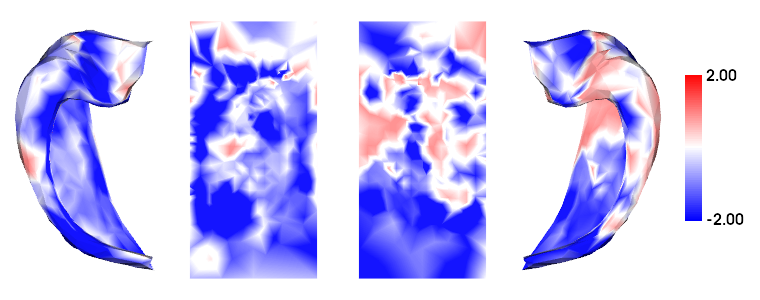

In [235]:
plotting.surfplot_canonical_foldunfold(reshape_1D(slm_tle_norm.t.flatten())[:,:,np.newaxis],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       cmap='bwr',
                                       color_range=(-2,2))

In [209]:
term_tle_mts = FixedEffect(thick_tle_df.MRI_MTS)

model_tle_mts = term_tle_age + term_tle_sex + term_tle_mts
contrast_tle_mts = (thick_tle_df.MRI_MTS == 1).astype(int) - (thick_tle_df.MRI_MTS == 0).astype(int)

slm_tle_mts = SLM(
    model_tle_norm,
    contrast_tle_mts,
    surf=surf,
    correction=['fdr','rft'],
    cluster_threshold=0.01)



slm_tle_mts.fit(Z_thick[thick_tle_df.index.to_list()])


2024-02-26 02:19:28,878 - brainstat - WARNING - Column 0 has 2 unique values but was supplied as a numeric (i.e. continuous) variable. Should it be a categorical variable? If yes, the easiest way to provide categorical variables is to convert numerics to strings.


/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/brainstat/stats/_t_test.py:51: UserWarning: Contrast is not in the model :-( 
  warnings.warn("Contrast is not in the model :-( ")


In [215]:
slm_tle_mts.P['clus'][1].head()

,clusid,nverts,resels,P
0,1,7.0,1.511881,0.059555
1,2,3.0,0.993779,0.115495
2,3,2.0,0.804375,0.155858
3,4,1.0,0.350759,0.394491
4,5,1.0,0.323779,0.422217


/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


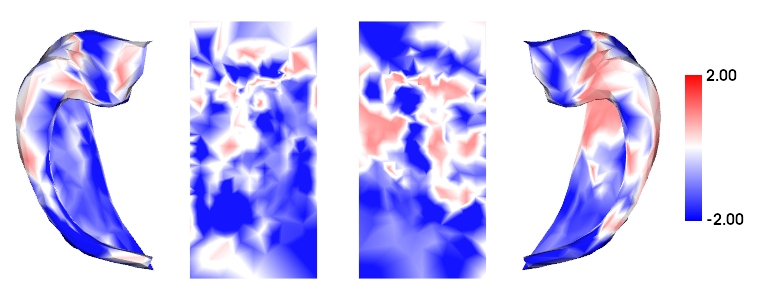

In [234]:
plotting.surfplot_canonical_foldunfold(reshape_1D(slm_tle_mts.t.flatten())[:,:,np.newaxis],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       cmap='bwr',
                                       color_range=(-2,2))

In [216]:
term_mts_thick = FixedEffect(snsx_thick_epi_cov_df_qc.MRI_MTS)
term_age_thick = FixedEffect(snsx_thick_epi_cov_df_qc.age)
term_sex_thick = FixedEffect(snsx_thick_epi_cov_df_qc.sex)
model_thick_mts = term_age_thick + term_sex_thick + term_mts_thick
contrast_thick_mts = (snsx_thick_epi_cov_df_qc.MRI_MTS == 1).astype(int) - (snsx_thick_epi_cov_df_qc.MRI_MTS == 0).astype(int)

slm_thick_mts = SLM(
    model_thick_mts,
    contrast_thick_mts,
    surf=surf,
    correction=['fdr','rft'],
    cluster_threshold=0.01)



slm_thick_mts.fit(Z_thick[snsx_thick_epi_cov_df_qc.index.to_list()])


2024-02-26 02:21:42,923 - brainstat - WARNING - Column 0 has 2 unique values but was supplied as a numeric (i.e. continuous) variable. Should it be a categorical variable? If yes, the easiest way to provide categorical variables is to convert numerics to strings.


In [233]:
slm_thick_mts.P['clus'][1].head()

,clusid,nverts,resels,P
0,1,12.0,2.514854,0.013236
1,2,2.0,0.302610,0.570253
2,3,1.0,0.255962,0.628430
3,4,1.0,0.245317,0.642185
4,5,1.0,0.179955,0.729241


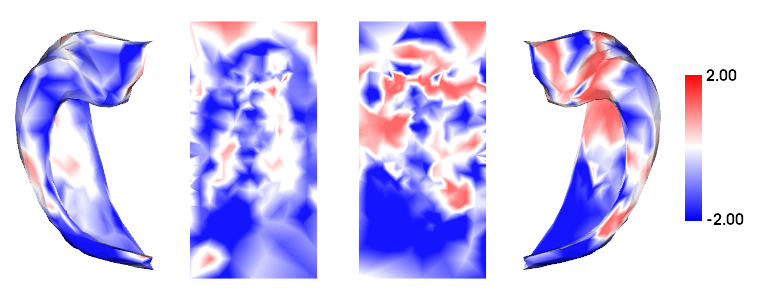

In [227]:
plotting.surfplot_canonical_foldunfold(reshape_1D(slm_thick_mts.t.flatten())[:,:,np.newaxis],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       cmap='bwr',
                                       color_range=(-2,2))

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


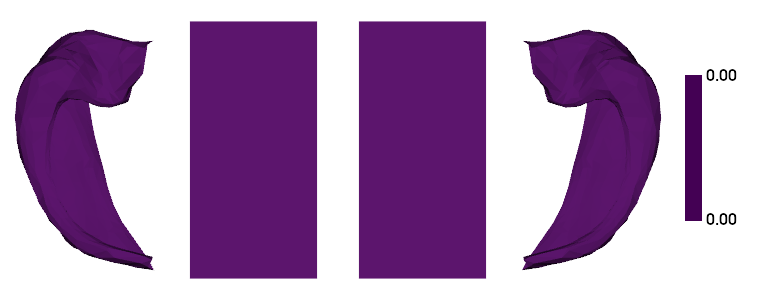

In [231]:
plotting.surfplot_canonical_foldunfold(reshape_1D((slm_thick_mts.P['pval']['C']<0.05).astype(int))[:,:,np.newaxis],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',)

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


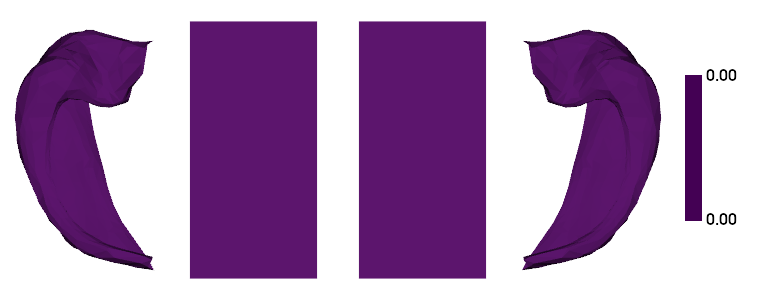

In [221]:
plotting.surfplot_canonical_foldunfold(reshape_1D(((slm_thick_mts.P['clusid'][1] == 1).astype(int).flatten() == 1))[:,:,np.newaxis].astype(int),
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',)

In [681]:

test = reshape_1D(((slm_thick_mts.P['clusid'][1] == 1).astype(int).flatten() == 1))[:,:,np.newaxis]


In [687]:
reshape_1D(((slm_thick_mts.P['clusid'][1] == 1).astype(int).flatten() == 1))[:,:,np.newaxis].astype(int)

array([[[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
        [0]],

       [[0],
       

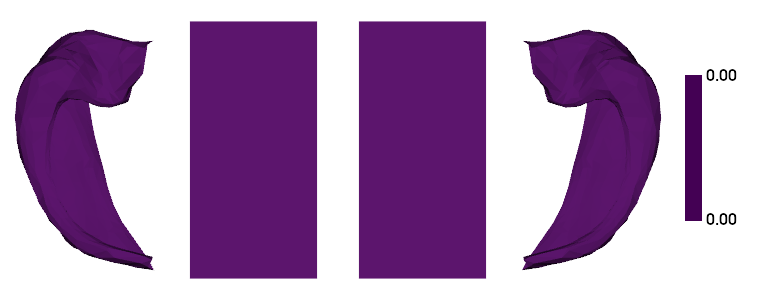

In [688]:
plotting.surfplot_canonical_foldunfold(reshape_1D(((slm_thick_mts.P['clusid'][1] == 1).astype(int).flatten() == 1))[:,:,np.newaxis].astype(int),
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',)

In [669]:
(slm_thick_mts.P['clusid'][1] == 1).astype(int)

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [649]:
slm_tle_mts.P['clus'][1]

,clusid,nverts,resels,P
0,1,7.0,1.511881,0.059555
1,2,3.0,0.993779,0.115495
2,3,2.0,0.804375,0.155858
3,4,1.0,0.350759,0.394491
4,5,1.0,0.323779,0.422217
5,6,1.0,0.309998,0.437403
6,7,1.0,0.279100,0.474207
7,8,1.0,0.000000,1.000000
8,9,1.0,0.000000,1.000000
9,10,1.0,0.000000,1.000000


In [611]:
slm_tle_norm.P['clus'][0]

,clusid,nverts,resels,P
0,1,1.0,0.27987461680777775,0.4732358528585051


In [554]:
slm_tle_normL.P['peak'][0]

,t,clusid,vertid,P


In [555]:
slm_tle_normL.P['peak'][1].head()

,t,clusid,vertid,P
0,6.334755,1,89,0.302987
1,5.966499,1,74,0.396634
2,5.875832,2,205,0.424702
3,5.355254,3,276,0.639333
4,4.014336,4,320,2.132671


In [236]:
slm_tle_norm.P['clus'][1].head()

,clusid,nverts,resels,P
0,1,3.0,1.339138,0.072758
1,2,2.0,0.804375,0.155858
2,3,5.0,0.782021,0.161912
3,4,2.0,0.510784,0.272482
4,5,2.0,0.496827,0.280826


In [567]:
slm_tle_normR.P['clus'][1]

,clusid,nverts,resels,P
0,1,4.0,1.167987,0.077384
1,2,4.0,0.903779,0.113805
2,3,1.0,0.447244,0.273672
3,4,1.0,0.260023,0.444199
4,5,1.0,0.221906,0.496220
5,6,1.0,0.157789,0.603250


In [599]:
cluster1 = np.concatenate([(slm_tle_normL.P['clusid'][1] == 1).astype(int),
                           (slm_tle_normR.P['clusid'][1] == 1).astype(int)],
                          axis=1).flatten()
tstat_tle_norm = np.concatenate([slm_tle_normL.t,
                                 slm_tle_normR.t]).flatten()

In [627]:
slm_tle_norm.P['clusid'][1]

array([[ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  6.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  8.,  0.,  0.,  0.,  0.,
         0.,  1.,  0.,  0.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  1.,  0.,  0.,  0.,  0.,  0.,  9.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  5.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  5.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  3.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  3.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.

In [597]:
slm_tle_normL.t.shape

(1, 419)

In [616]:
slm_tle_norm.P['clus'][1]

,clusid,nverts,resels,P
0,1,3.0,1.339138,0.072758
1,2,2.0,0.804375,0.155858
2,3,5.0,0.782021,0.161912
3,4,2.0,0.510784,0.272482
4,5,2.0,0.496827,0.280826
5,6,1.0,0.353381,0.391930
6,7,1.0,0.328059,0.417644
7,8,1.0,0.323779,0.422217
8,9,1.0,0.279100,0.474207
9,10,1.0,0.235550,0.533285


/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


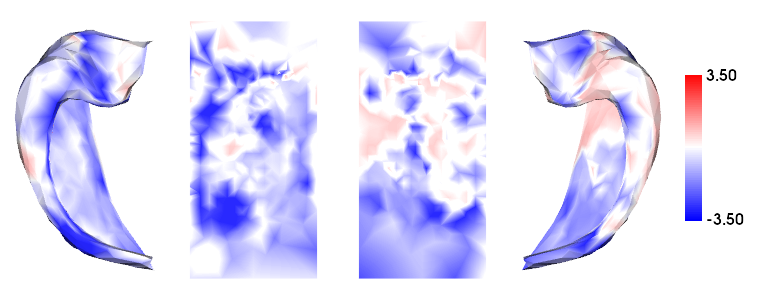

In [619]:

plotting.surfplot_canonical_foldunfold(reshape_1D(slm_tle_norm.t.flatten())[:,:,np.newaxis],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                      cmap='bwr',
                                      color_range=(-3.5,3.5))
                                       

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/vtk_interface/wrappers/data_object.py:166: UserWarning: Input array is boolean. Casting to uint8.
  warnings.warn('Input array is boolean. Casting to uint8.')
/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


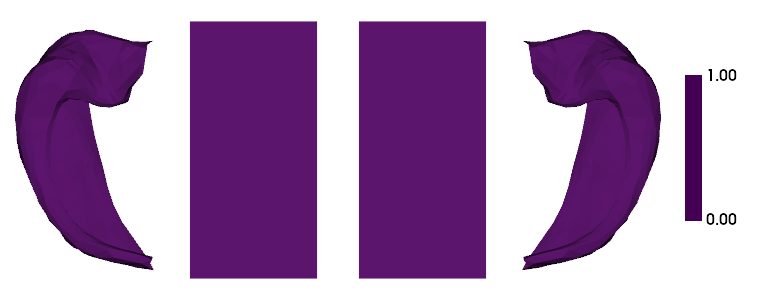

In [629]:


plotting.surfplot_canonical_foldunfold(reshape_1D((slm_tle_norm.P['clusid'][0].flatten() == 1))[:,:,np.newaxis],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       color_range=(0,1),
                                      interactive=True)
                                       

In [634]:
thick_tle_df

,participant_id,age,sex,Temporal,Bilobal,Right,Left,Engel_IA,Engel_IB,Engel_IC,...,Engel_I=1,ilae_1,ilae_2,ilae_3,ilae_4,ilae_5,ilae_6,MRI_Normal,MRI_MTS,pass
3,sub-P014,33,m,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,True
9,sub-P026,36,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,True
13,sub-P046,21,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,True
14,sub-P058,43,m,1.0,1.0,0.0,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,True
20,sub-P074,36,m,1.0,1.0,0.0,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,True
21,sub-P076,26,f,1.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,True
26,sub-P087,18,f,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,True
27,sub-P090,32,f,1.0,1.0,0.0,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,True
32,sub-P100,41,f,1.0,1.0,0.0,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,True


<AxesSubplot: xlabel='Temporal'>

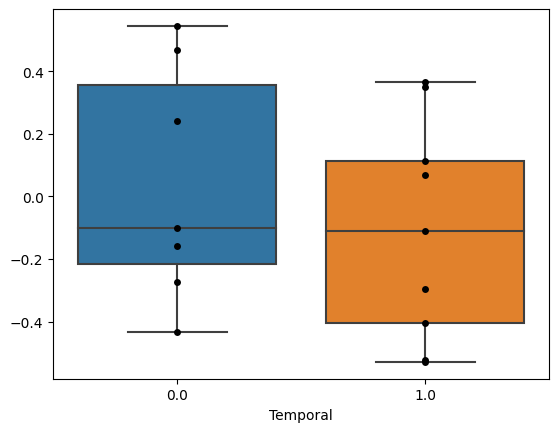

In [633]:
fig, ax = plt.subplots()
sns.boxplot(x=snsx_thick_epi_cov_df_qc.Temporal,
            y = Z_thick[snsx_thick_epi_cov_df_qc.index].mean(axis=1),
            ax=ax)
sns.stripplot(x=snsx_thick_epi_cov_df_qc.Temporal,
            y = Z_thick[snsx_thick_epi_cov_df_qc.index].mean(axis=1),
            ax=ax,color='black',jitter=0)

In [ ]:

control_MRI_Normal = (snsx_thick_epi_cov_df_qc.MRI_Normal== 0).astype(int) -(snsx_thick_epi_cov_df_qc.MRI_Normal== 0).astype(int) 


In [171]:
contrast_temporal =(snsx_thick_epi_cov_df_qc.Temporal == 1) - (snsx_thick_epi_cov_df_qc.Temporal == 0)

TypeError: numpy boolean subtract, the `-` operator, is not supported, use the bitwise_xor, the `^` operator, or the logical_xor function instead.

In [492]:
slm_thick = SLM(
    term_age+term_sex+term_temporal,
    snsx_thick_epi_cov_df_qc.Temporal,
    surf=surf,
    correction=['fdr','rft'],
    cluster_threshold=0.01)
slm_thick.fit(Z_thick[snsx_thick_epi_cov_df_qc.index])

In [502]:
slm_thick.P['peak'][0].head()

,t,vertid,clusid,P
0,2.939031518986285,377,1,4.835818456497917


In [503]:
slm_thick.P['peak'][1].head()

,t,vertid,clusid,P
0,4.403007,312,1,0.360836
1,4.098285,723,12,0.619229
2,3.943104,26,2,0.818393
3,3.679748,736,9,1.320451
4,3.645159,757,7,1.406497


In [504]:
slm_thick.P['clus'][0]

,clusid,nverts,resels,P
0,1,1.0,0.0825474744411781,0.8440270313285534


In [505]:
slm_thick.P['clus'][1].head()

,clusid,nverts,resels,P
0,1,3.0,0.676645,0.242935
1,2,1.0,0.545986,0.322884
2,3,1.0,0.308599,0.546345
3,4,1.0,0.226311,0.650084
4,5,1.0,0.175950,0.718204


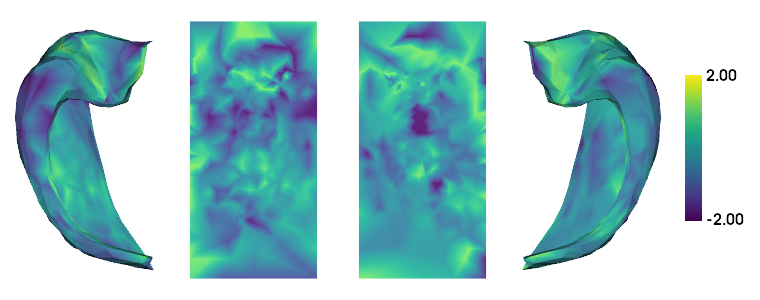

In [310]:


plotting.surfplot_canonical_foldunfold(reshape_1D(slm_thick_temporal.t.flatten())[:,:,np.newaxis],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       color_range=(-2,2))
                                       

In [352]:
slm_thick_temporal.t.shape

(1, 419)

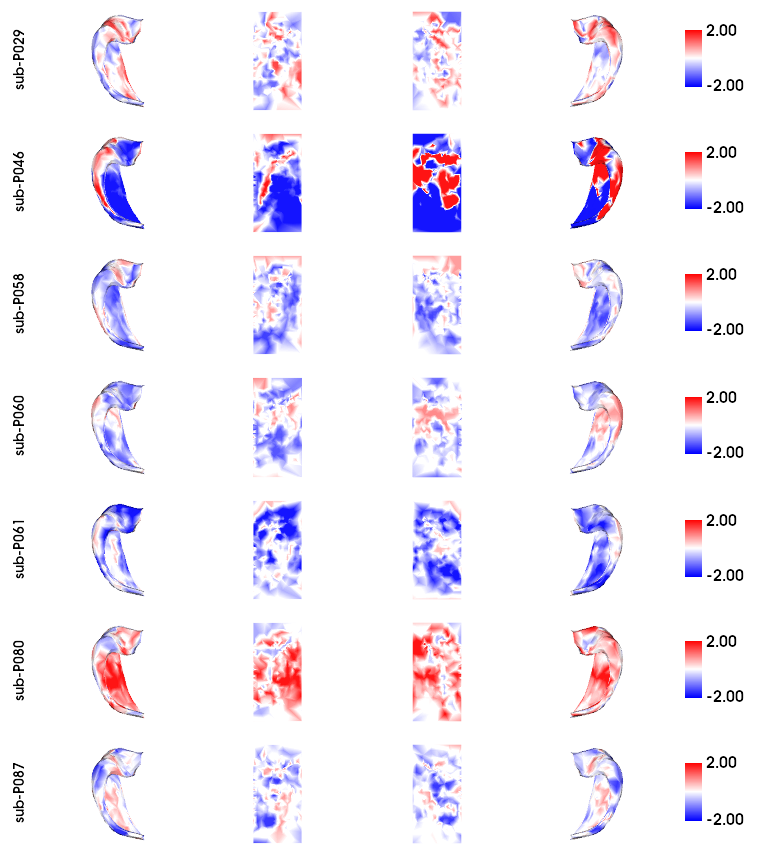

In [277]:
plotting.surfplot_canonical_foldunfold(reshape4surfplot(Z_thick)[:,:,snsx_epi_cov_df.index[snsx_epi_cov_df.MRI_MTS == 1]],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       cmap='bwr',
                                       color_range=(-2,2),
                                       label_text=snsx_epi_cov_df[snsx_epi_cov_df.MRI_MTS == 1].participant_id.to_list())


In [281]:
snsx_epi_cov_df[snsx_epi_cov_df.MRI_MTS == 1]

,participant_id,age,sex,Temporal,Bilobal,Right,Left,Engel_IA,Engel_IB,Engel_IC,...,Engel_IVC,Engel_I=1,ilae_1,ilae_2,ilae_3,ilae_4,ilae_5,ilae_6,MRI_Normal,MRI_MTS
11,sub-P029,40,m,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
13,sub-P046,21,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
14,sub-P058,43,m,1.0,1.0,0.0,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0
15,sub-P060,45,m,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
16,sub-P061,59,f,1.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
23,sub-P080,51,m,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
26,sub-P087,18,f,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


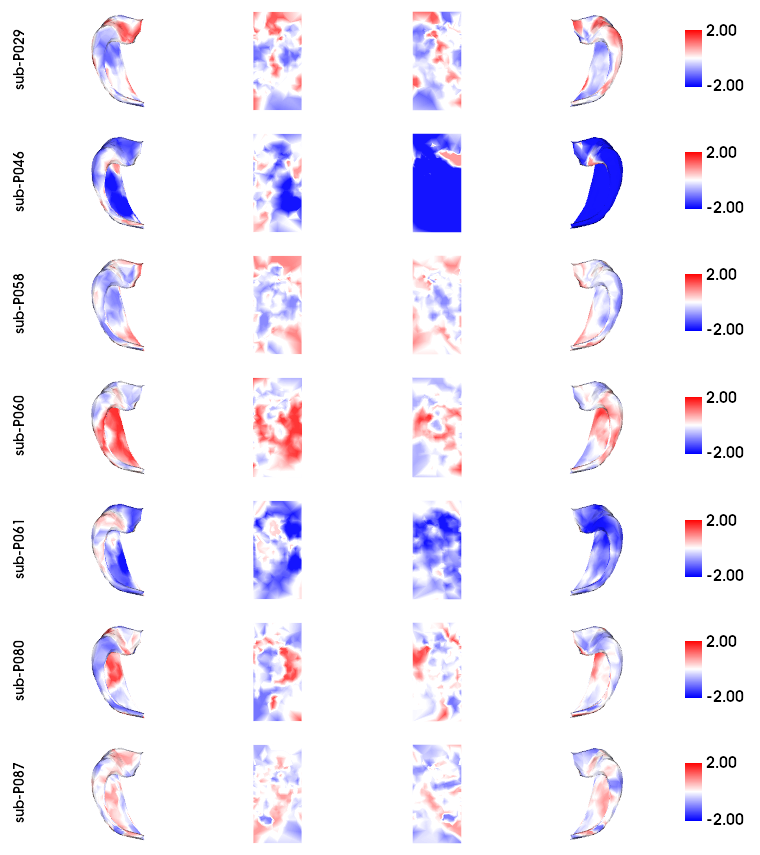

In [276]:
plotting.surfplot_canonical_foldunfold(reshape4surfplot(Z_gyr)[:,:,snsx_epi_cov_df.index[snsx_epi_cov_df.MRI_MTS == 1]],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       cmap='bwr',
                                       color_range=(-2,2),
                                       label_text=snsx_epi_cov_df[snsx_epi_cov_df.MRI_MTS == 1].participant_id.to_list())


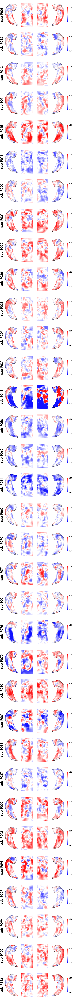

In [93]:
plotting.surfplot_canonical_foldunfold(reshape4surfplot(Z_thick)[:,:,0:34],labels=['hipp'],den='2mm',tighten_cwindow=True, embed_nb=True, color_bar='right',share='row',cmap='bwr',color_range=(-2,2),label_text=snsx_epi_cov_df.participant_id.to_list())



In [265]:
term_mts_gyr = FixedEffect(snsx_gyr_epi_cov_df_qc.MRI_MTS)
term_age_gyr = FixedEffect(snsx_gyr_epi_cov_df_qc.age)
term_sex_gyr = FixedEffect(snsx_gyr_epi_cov_df_qc.sex)
model_gyr_mts = term_age_gyr + term_sex_gyr + term_mts_gyr
contrast_gyr_mts = (snsx_gyr_epi_cov_df_qc.MRI_MTS == 1).astype(int) - (snsx_gyr_epi_cov_df_qc.MRI_MTS == 0).astype(int)

slm_gyr_mts = SLM(
    model_gyr_mts,
    contrast_gyr_mts,
    surf=surf,
    correction=['fdr','rft'],
    cluster_threshold=0.01)



slm_gyr_mts.fit(Z_gyr[snsx_gyr_epi_cov_df_qc.index.to_list()])


2024-02-26 03:03:26,806 - brainstat - WARNING - Column 0 has 2 unique values but was supplied as a numeric (i.e. continuous) variable. Should it be a categorical variable? If yes, the easiest way to provide categorical variables is to convert numerics to strings.


In [266]:
slm_gyr_mts.P['clus'][1].head()

,clusid,nverts,resels,P
0,1,2.0,0.480721,0.274779
1,2,2.0,0.228002,0.512197
2,3,2.0,0.219656,0.522826
3,4,1.0,0.083337,0.720167
4,5,1.0,0.000000,1.000000


/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


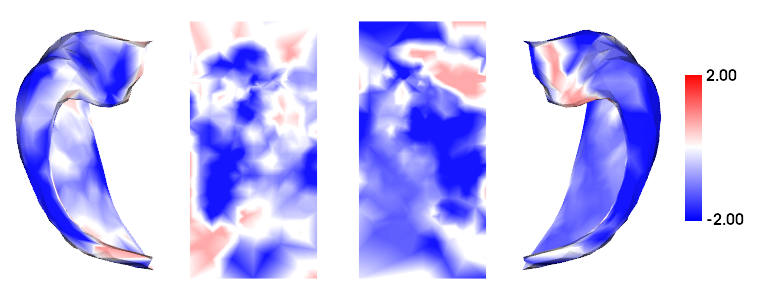

In [267]:
plotting.surfplot_canonical_foldunfold(reshape_1D(slm_gyr_mts.t.flatten())[:,:,np.newaxis],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       cmap='bwr',
                                       color_range=(-2,2))

In [244]:
gyr_tle_cov = snsx_gyr_epi_cov_df_qc[snsx_gyr_epi_cov_df_qc.Temporal == 1]

In [247]:


term_tle_mts_gyr = FixedEffect(gyr_tle_cov.MRI_MTS)
term_tle_age_gyr = FixedEffect(gyr_tle_cov.age)
term_tle_sex_gyr = FixedEffect(gyr_tle_cov.sex)
model_tle_gyr_mts = term_tle_age_gyr + term_tle_sex_gyr + term_tle_mts_gyr
contrast_tle_gyr_mts = (gyr_tle_cov.MRI_MTS == 1).astype(int) - (gyr_tle_cov.MRI_MTS == 0).astype(int)

slm_gyr_tle_mts = SLM(
    model_tle_gyr_mts,
    contrast_tle_gyr_mts,
    surf=surf,
    correction=['fdr','rft'],
    cluster_threshold=0.01)



slm_gyr_tle_mts.fit(Z_gyr[gyr_tle_cov.index.to_list()])

2024-02-26 02:51:03,180 - brainstat - WARNING - Column 0 has 2 unique values but was supplied as a numeric (i.e. continuous) variable. Should it be a categorical variable? If yes, the easiest way to provide categorical variables is to convert numerics to strings.


In [250]:
slm_gyr_tle_mts.P['clus'][1]

,clusid,nverts,resels,P
0,1,4.0,1.131743,0.065199
1,2,1.0,0.184069,0.475838
2,3,1.0,0.182465,0.478412


/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


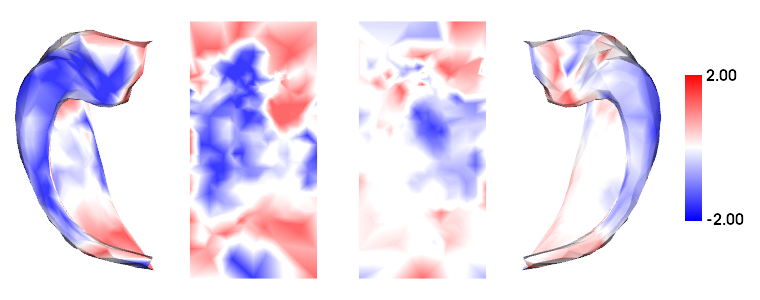

In [248]:
plotting.surfplot_canonical_foldunfold(reshape_1D(slm_gyr_tle_mts.t.flatten())[:,:,np.newaxis],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       cmap='bwr',
                                       color_range=(-2,2))
                                       

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


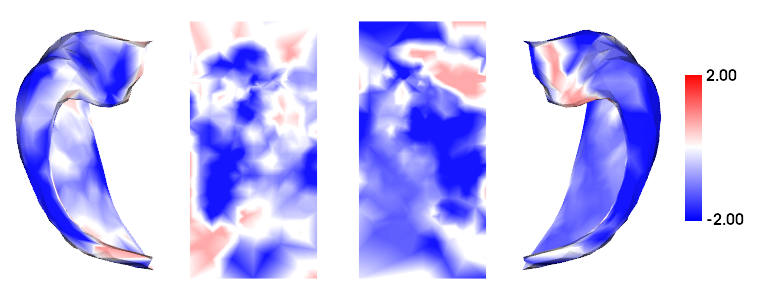

In [81]:
plotting.surfplot_canonical_foldunfold(reshape_1D(slm_gyr_mts.t.flatten())[:,:,np.newaxis],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       cmap='bwr',
                                       color_range=(-2,2))
                                       

In [255]:
term_mts_gyr = FixedEffect(snsx_gyr_epi_cov_df_qc.MRI_MTS)
term_age_gyr = FixedEffect(snsx_gyr_epi_cov_df_qc.age)
term_sex_gyr = FixedEffect(snsx_gyr_epi_cov_df_qc.sex)
model_gyr_mts = term_age_gyr + term_sex_gyr + term_mts_gyr
contrast_gyr_mts = (snsx_gyr_epi_cov_df_qc.MRI_MTS == 1).astype(int) - (snsx_gyr_epi_cov_df_qc.MRI_MTS == 0).astype(int)

slm_gyr_mts = SLM(
    model_gyr_mts,
    contrast_gyr_mts,
    surf=surf,
    correction=['fdr','rft'],
    cluster_threshold=0.01)



slm_gyr_mts.fit(Z_gyr[snsx_gyr_epi_cov_df_qc.index.to_list()])

2024-02-26 02:54:04,159 - brainstat - WARNING - Column 0 has 2 unique values but was supplied as a numeric (i.e. continuous) variable. Should it be a categorical variable? If yes, the easiest way to provide categorical variables is to convert numerics to strings.


In [256]:
slm_gyr_mts.P['clus'][1].head()

,clusid,nverts,resels,P
0,1,2.0,0.480721,0.274779
1,2,2.0,0.228002,0.512197
2,3,2.0,0.219656,0.522826
3,4,1.0,0.083337,0.720167
4,5,1.0,0.000000,1.000000


In [258]:


term_norm_gyr = FixedEffect(gyr_tle_cov.MRI_Normal)
term_norm_age_gyr = FixedEffect(gyr_tle_cov.age)
term_norm_sex_gyr = FixedEffect(gyr_tle_cov.sex)
model_norm_gyr = term_norm_age_gyr + term_norm_sex_gyr + term_norm_gyr
contrast_tle_gyr_norm = (gyr_tle_cov.MRI_Normal == 1).astype(int) - (gyr_tle_cov.MRI_Normal == 0).astype(int)

slm_gyr_tle_norm = SLM(
    model_norm_gyr,
    contrast_tle_gyr_norm,
    surf=surf,
    correction=['fdr','rft'],
    cluster_threshold=0.01)



slm_gyr_tle_norm.fit(Z_gyr[gyr_tle_cov.index.to_list()])

2024-02-26 02:56:36,931 - brainstat - WARNING - Column 0 has 2 unique values but was supplied as a numeric (i.e. continuous) variable. Should it be a categorical variable? If yes, the easiest way to provide categorical variables is to convert numerics to strings.


In [262]:
slm_gyr_tle_norm.P['clus'][0].head()


,clusid,nverts,resels,P
0,1,4.0,1.139413,0.068268
1,2,4.0,0.960684,0.088556
2,3,3.0,0.309975,0.337827
3,4,1.0,0.260499,0.390043
4,5,1.0,0.248593,0.404307


/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


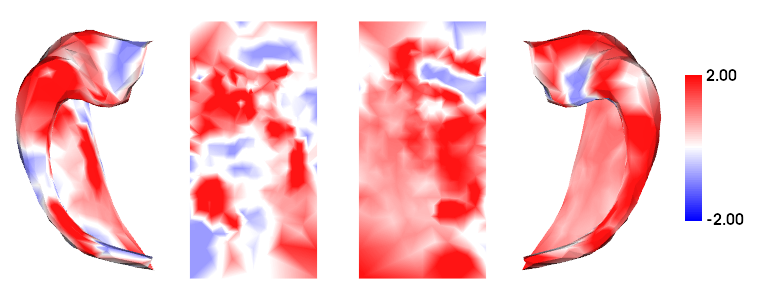

In [263]:
plotting.surfplot_canonical_foldunfold(reshape_1D(slm_gyr_tle_norm.t.flatten())[:,:,np.newaxis],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       cmap='bwr',
                                       color_range=(-2,2))
                                       

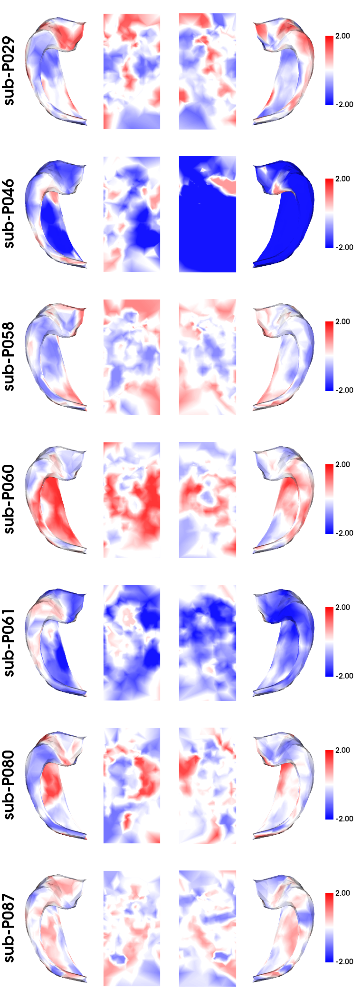

In [94]:
plotting.surfplot_canonical_foldunfold(reshape4surfplot(Z_gyr)[:,:,snsx_epi_cov_df.index[snsx_epi_cov_df.MRI_MTS == 1]],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       cmap='bwr',
                                       color_range=(-2,2),
                                       label_text=snsx_epi_cov_df[snsx_epi_cov_df.MRI_MTS == 1].participant_id.to_list())


/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


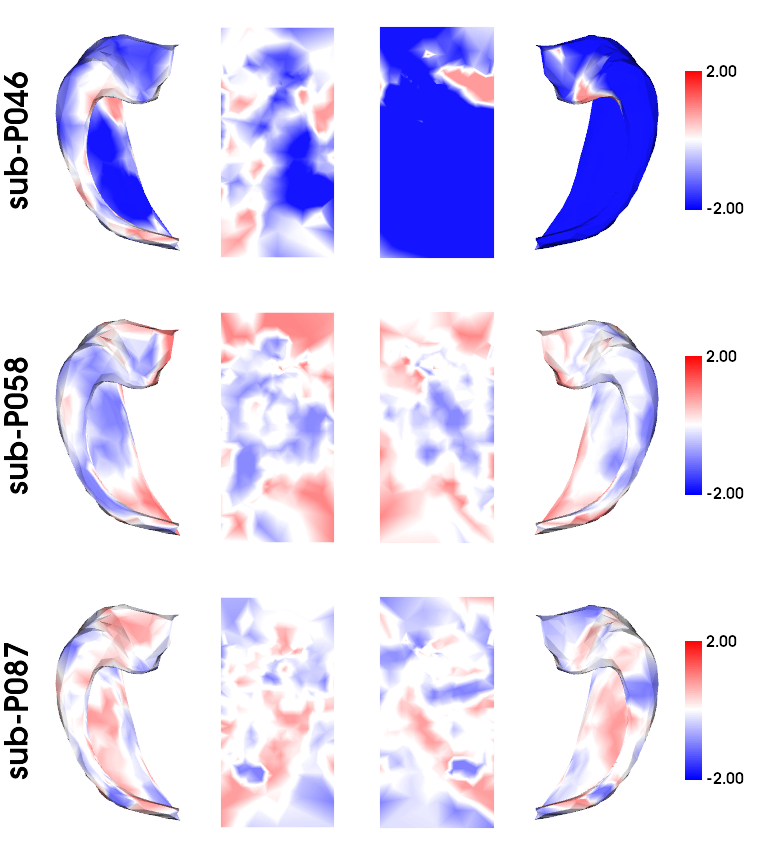

In [207]:
plotting.surfplot_canonical_foldunfold(reshape4surfplot(Z_gyr)[:,:,snsx_gyr_epi_cov_df_qc.index[snsx_gyr_epi_cov_df_qc.MRI_MTS == 1]],
                                       labels=['hipp'],den='2mm',
                                       tighten_cwindow=True,
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       cmap='bwr',
                                       color_range=(-2,2),
                                       label_text=snsx_gyr_epi_cov_df_qc[snsx_gyr_epi_cov_df_qc.MRI_MTS == 1].participant_id.to_list())


In [ ]:
my

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


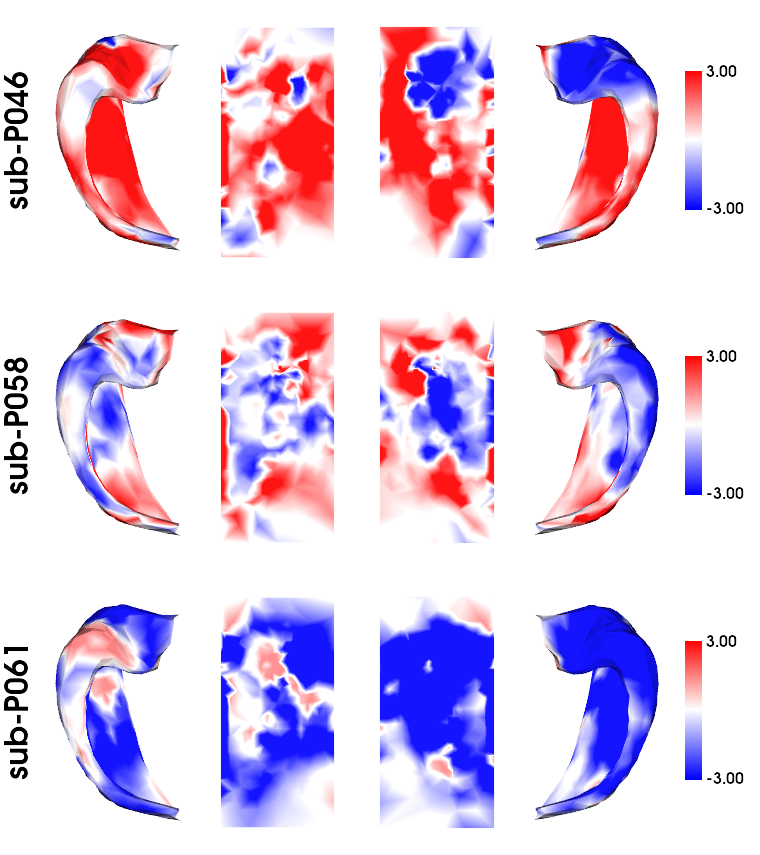

In [293]:
plotting.surfplot_canonical_foldunfold(reshape4surfplot(Z_myelin)[:,:,myelin_df_qc.index[myelin_df_qc.MRI_MTS == 1]],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       cmap='bwr',
                                       color_range=(-3,3),
                                      label_text=myelin_df_qcfractional anisotropy hippocampus.participant_id[myelin_df_qc.MRI_MTS == 1].to_list())


In [ ]:
myelin_cov_df.index[myelin_cov_df.MRI_Normal == 1]

In [164]:
myelin_tle_norm_bool = (myelin_cov_df2.Temporal == 1) & (myelin_cov_df2.MRI_Normal == 1)
myelin_tle_nonnorm_bool = (myelin_cov_df2.Temporal == 1) & (myelin_cov_df2.MRI_Normal == 0)

In [170]:
myelin_cov_df

,participant_id,age,sex,Temporal,Bilobal,Right,Left,Engel_IA,Engel_IB,Engel_IC,...,Engel_IVC,Engel_I=1,ilae_1,ilae_2,ilae_3,ilae_4,ilae_5,ilae_6,MRI_Normal,MRI_MTS
0,sub-P008,26,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,sub-P012,28,m,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,sub-P013,37,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,sub-P014,33,m,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,sub-P018,29,f,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5,sub-P020,37,f,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7,sub-P021,32,f,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
8,sub-P022,21,f,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,sub-P026,36,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
10,sub-P028,20,f,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [167]:
myelin_cov_df2

,participant_id,age,sex,Temporal,Bilobal,Right,Left,Engel_IA,Engel_IB,Engel_IC,...,Engel_IVC,Engel_I=1,ilae_1,ilae_2,ilae_3,ilae_4,ilae_5,ilae_6,MRI_Normal,MRI_MTS
0,sub-P008,26,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,sub-P012,28,m,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,sub-P013,37,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,sub-P014,33,m,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,sub-P018,29,f,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5,sub-P020,37,f,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
6,sub-P021,32,f,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
7,sub-P022,21,f,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
8,sub-P026,36,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,sub-P028,20,f,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


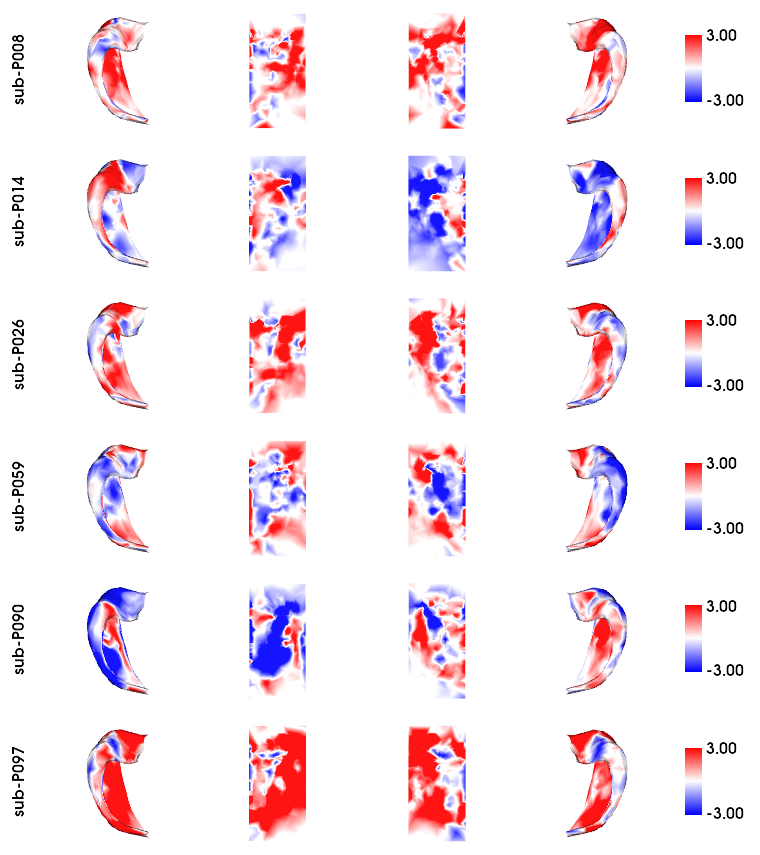

In [166]:
plotting.surfplot_canonical_foldunfold(reshape4surfplot(Z_myelin)[:,:,myelin_cov_df2.index[myelin_tle_norm_bool]],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       cmap='bwr',
                                       color_range=(-3,3),
                                      label_text=myelin_cov_df2.participant_id[myelin_tle_norm_bool].to_list())

/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


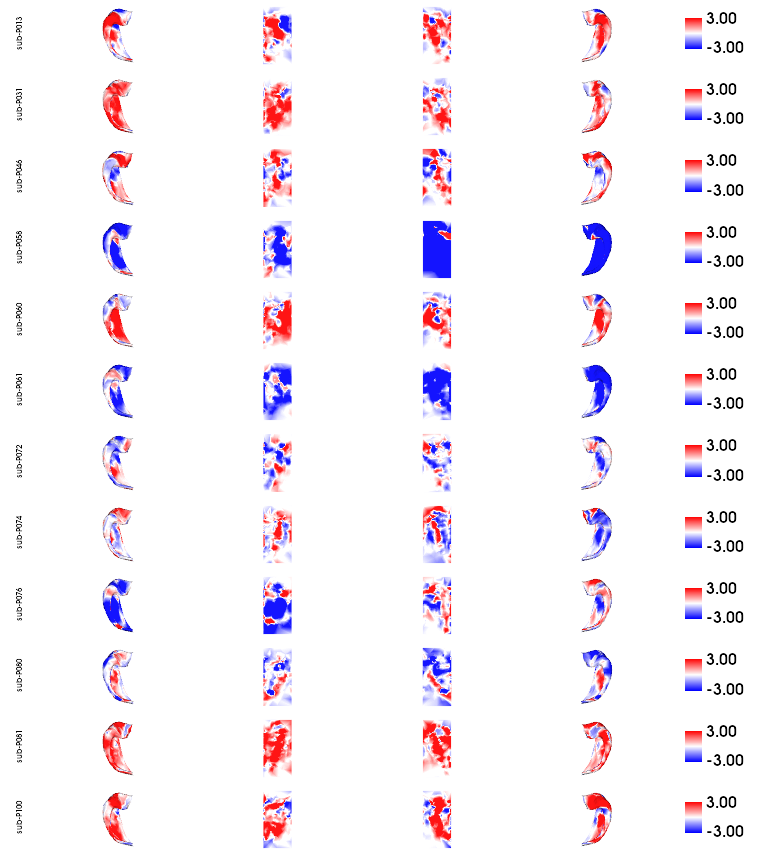

In [169]:
plotting.surfplot_canonical_foldunfold(reshape4surfplot(Z_myelin)[:,:,myelin_cov_df2.index[myelin_tle_nonnorm_bool]],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       cmap='bwr',
                                       color_range=(-3,3),
                                      label_text=myelin_cov_df2.participant_id[myelin_tle_nonnorm_bool].to_list())



In [113]:
myelin_df_qc

,participant_id,age,sex,Temporal,Bilobal,Right,Left,Engel_IA,Engel_IB,Engel_IC,...,Engel_IVC,Engel_I=1,ilae_1,ilae_2,ilae_3,ilae_4,ilae_5,ilae_6,MRI_Normal,MRI_MTS
0,sub-P008,26,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,sub-P012,28,m,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,sub-P013,37,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,sub-P014,33,m,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,sub-P018,29,f,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5,sub-P020,37,f,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
6,sub-P020,37,f,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7,sub-P021,32,f,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
8,sub-P022,21,f,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,sub-P026,36,f,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


/home/ROBARTS/myousif/virtualenvs/pcntoolkit_dev_cbs_venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/plotting/base.py:287: UserWarning: Interactive mode requires 'panel'. Setting 'interactive=False'
  warnings.warn("Interactive mode requires 'panel'. "


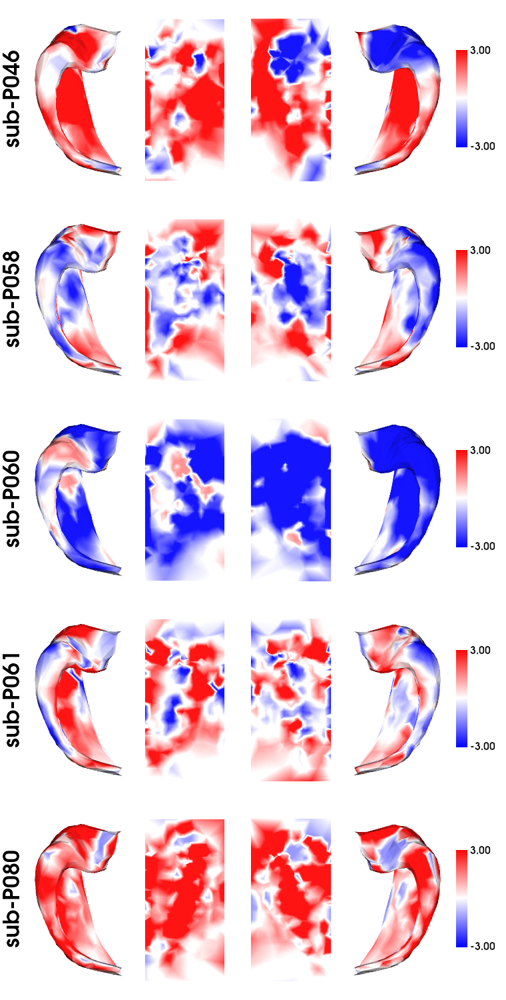

In [69]:
plotting.surfplot_canonical_foldunfold(reshape4surfplot(Z_myelin)[:,:,myelin_df_qc.index[myelin_df_qc.MRI_MTS == 1]],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       cmap='bwr',
                                       color_range=(-3,3),
                                      label_text=myelin_df_qc.participant_id[myelin_cov_df.MRI_MTS == 1].to_list())

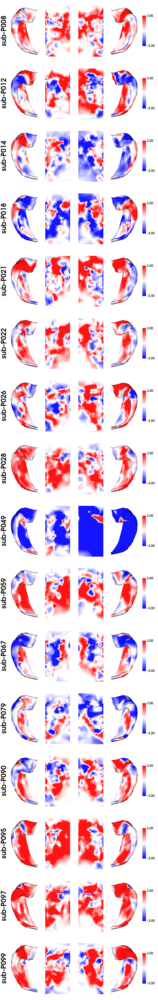

In [68]:
plotting.surfplot_canonical_foldunfold(reshape4surfplot(Z_myelin)[:,:,myelin_cov_df.index[myelin_cov_df.MRI_Normal == 1]],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       cmap='bwr',
                                       color_range=(-3,3),
                                      label_text=myelin_cov_df.participant_id[myelin_cov_df.MRI_Normal == 1].to_list())


In [113]:
pd.merge(snsx_epi_df[snsx_epi_df.MRI_Normal == 0],snsx_epi_localization_df,on=['participant_id'],how='left')

,participant_id,age,sex,Temporal_x,MRI_MTS,MRI_Normal,Focal,Generalized,Unknown,Temporal_y,Frontal,Parietal,Insular,Occipital,Bilobal,Right,Left,Other
0,sub-P013,37.0,1,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,sub-P020,37.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,sub-P020,37.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,sub-P020,37.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,sub-P020,37.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,sub-P029,40.0,2,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
6,sub-P031,44.0,1,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
7,sub-P046,21.0,1,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
8,sub-P058,43.0,2,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
9,sub-P060,45.0,2,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [62]:


mri_pos_TLE_bool = (snsx_gyr_epi_cov_df_qc.MRI_Normal == 0) & (snsx_gyr_epi_cov_df_qc.Temporal == 1)



In [63]:
mri_MTS_bool = (snsx_gyr_epi_cov_df_qc.MRI_MTS == 1)

In [216]:
reshape4surfplot(Z_gyr)[:,:,snsx_gyr_epi_cov_df_qc.index[snsx_gyr_epi_cov_df_qc.Temporal == 1]]

array([[[-0.58620189,  0.66636469, -0.88423098, ...,  0.09899515,
          2.29319105,  0.06850567],
        [-0.91344254,  0.87173885, -2.01456688, ..., -1.3885599 ,
          0.36257618, -0.0791446 ]],

       [[-0.09682069, -0.38682369, -0.69887205, ..., -0.82336391,
         -0.50661066, -0.54215511],
        [-0.4375487 ,  0.26623938, -0.44861445, ...,  2.01607255,
         -0.28606348,  0.02656698]],

       [[-0.91989339,  1.20977981, -0.17118362, ..., -0.51571801,
          0.54112853, -0.35942154],
        [ 1.11628021,  0.8161452 , -0.74235587, ..., -0.49874958,
         -0.45327256, -0.58678118]],

       ...,

       [[-0.74631411, -0.84640708, -0.47354043, ..., -0.48266294,
          0.61654757, -0.41624087],
        [-0.03680626, -1.37584643, -2.27231333, ..., -0.83433865,
          2.00854126,  0.11275759]],

       [[-0.55460351,  1.05179793, -1.33348002, ..., -0.36868917,
         -0.53946832,  0.71285484],
        [-0.93631823,  0.67600376, -2.79673694, ...,  0.27253

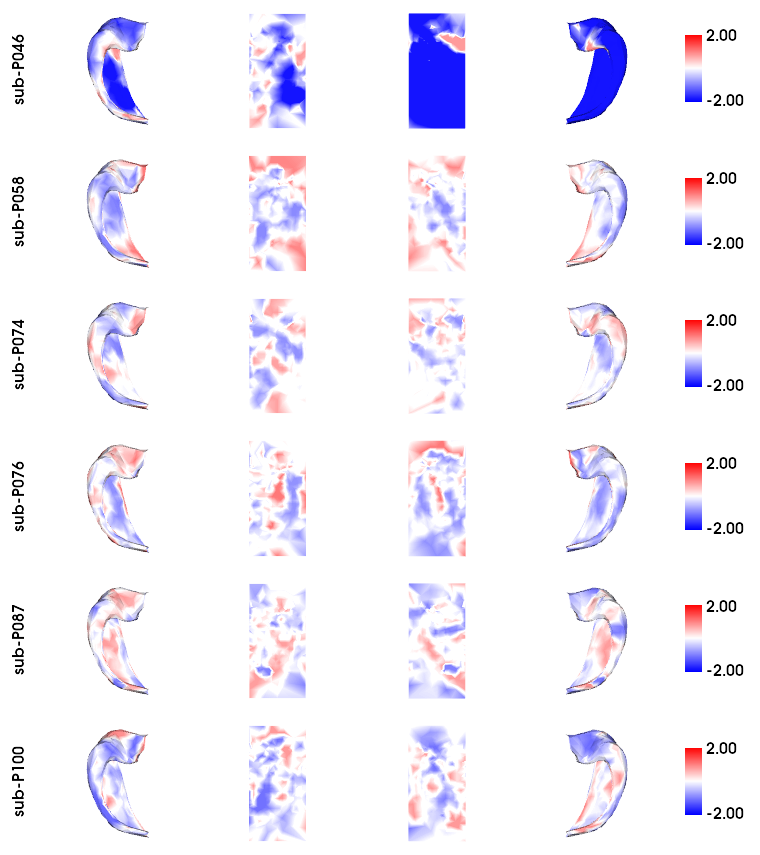

In [91]:
plotting.surfplot_canonical_foldunfold(reshape4surfplot(Z_gyr)[:,:,snsx_gyr_epi_cov_df_qc.index[mri_pos_TLE_bool]],
                                       labels=['hipp'],
                                       den='2mm',
                                       tighten_cwindow=True, 
                                       embed_nb=True, 
                                       color_bar='right',
                                       share='row',
                                       cmap='bwr',
                                       color_range=(-2,2),
                                       label_text=snsx_gyr_epi_cov_df_qc.participant_id[mri_pos_TLE_bool].to_list())


In [82]:
yhat_te, s2_te, Z = predict(epi_covs_paths2[0],
                            alg='blr',
                            respfile=epi_resp_paths[0],
                            model_path = 'thick_2mm_bspline_blr_model/Models/',
                            saveout=False,
                            warp=True,
                            adaptrespfile = ctrl_resp_paths[0],
                            adaptcovfile = ctrl_covs_paths2[0],
                            adaptvargroupfile = 'snsx_data/snsx_ctrl_sites.txt',
                            testvargroupfile= 'snsx_data/snsx_epi_sites.txt')

Loading data ...
Prediction by model  1 of 838


ValueError: operands could not be broadcast together with shapes (39,) (39,838) 